# Forest Monitoring 

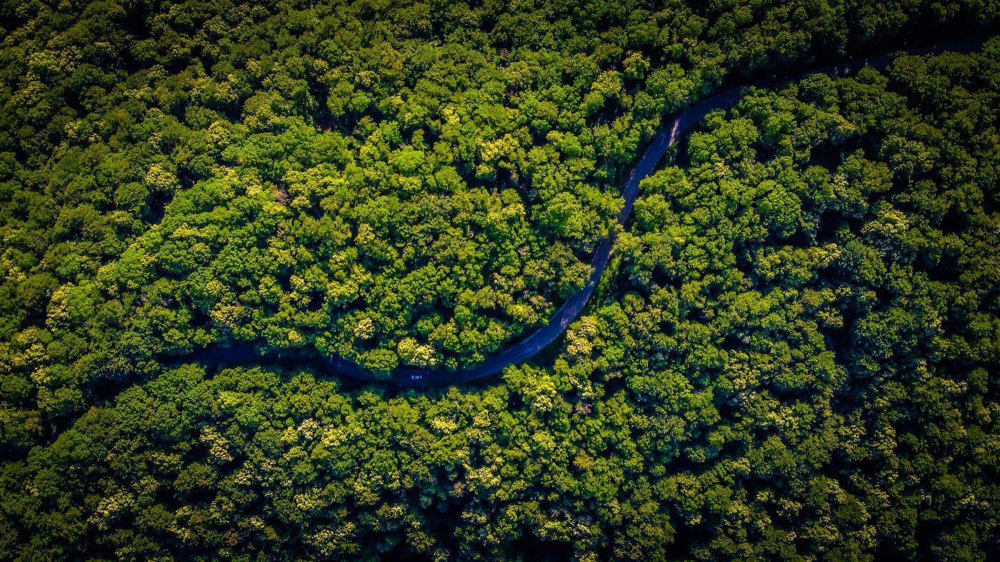

The dataset is composed of a set of Sentinel-2 satellite images collected over a set of areas in different times. 

Load all needed libraries to access, manipulate, and preprocess the data, as well as to analyze them with a ML model

In [1]:
import os
import sys
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from IPython.display import Image, display
from eolearn.core import EOPatch,FeatureType
import itertools
from sklearn.model_selection import train_test_split
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import average_precision_score, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score
from scipy.stats import norm
from utils.utils import plot_confusion_matrix

Loading all eopatches 

In [2]:
folder = './data/00_eo_learn_data/'
patches = ['eopatch_0',  'eopatch_1', 'eopatch_2' ,'eopatch_3']

In [3]:
eopatches = []

for i in patches:
    print(folder+i)
    eopatches.append(EOPatch.load(folder+i))

./data/00_eo_learn_data/eopatch_0
./data/00_eo_learn_data/eopatch_1
./data/00_eo_learn_data/eopatch_2
./data/00_eo_learn_data/eopatch_3


In [4]:
eopatches[0]

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(10, 736, 340, 8), dtype=float32)
    CLP: numpy.ndarray(shape=(10, 736, 340, 1), dtype=float32)
    FEATURES: numpy.ndarray(shape=(10, 736, 340, 11), dtype=float32)
    NDVI: numpy.ndarray(shape=(10, 736, 340, 1), dtype=float32)
    NDWI: numpy.ndarray(shape=(10, 736, 340, 1), dtype=float32)
    NORM: numpy.ndarray(shape=(10, 736, 340, 1), dtype=float32)
  }
  mask={
    CLM: numpy.ndarray(shape=(10, 736, 340, 1), dtype=bool)
    IS_DATA: numpy.ndarray(shape=(10, 736, 340, 1), dtype=bool)
    IS_VALID: numpy.ndarray(shape=(10, 736, 340, 1), dtype=bool)
  }
  mask_timeless={
    CORINE: numpy.ndarray(shape=(736, 340, 1), dtype=uint16)
    LULC: numpy.ndarray(shape=(736, 340, 1), dtype=uint8)
    LULC_ERODED: numpy.ndarray(shape=(736, 340, 1), dtype=uint8)
    VALID_COUNT: numpy.ndarray(shape=(736, 340, 1), dtype=int64)
  }
)

Now let's inspect the actual satellite data contained in the "data" object. 

In [5]:
s2_data = eopatches[0]['data']['BANDS']
'S2 data. Shape: {}. Data type: {}'.format(s2_data.shape, s2_data.dtype)

'S2 data. Shape: (10, 736, 340, 8). Data type: float32'

In the provided data the following bands (in this order) are available: B02, B03, B04, B05, B06, B07, B11, B12

A way of displaying a satellite image is to choose three of this bands and map them to the R,G,B channels. This operation is known as band combination

In [6]:
def display_s2_image(patch, time_idx = 0, bands=(2, 1, 0), exp=3.5, axes=None):
    s2_data = patch['data']['BANDS'][time_idx]
    if (axes):
        axes.imshow(np.clip(s2_data[..., bands] * exp, 0, 1))
    else:
        plt.figure(figsize = (15,15))
        plt.imshow(np.clip(s2_data[..., bands] * exp, 0, 1))

Let's display the NDVI index for a given eopatch

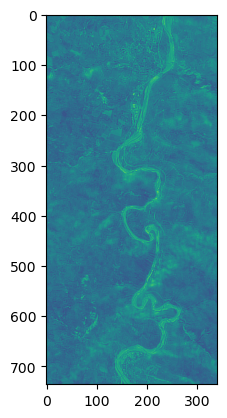

In [7]:
plt.imshow(eopatches[0]['data']['NDWI'][0].squeeze())
#plt.savefig("ndvi_eo2.png")

Let's display the a given eopatch using different band combinations 

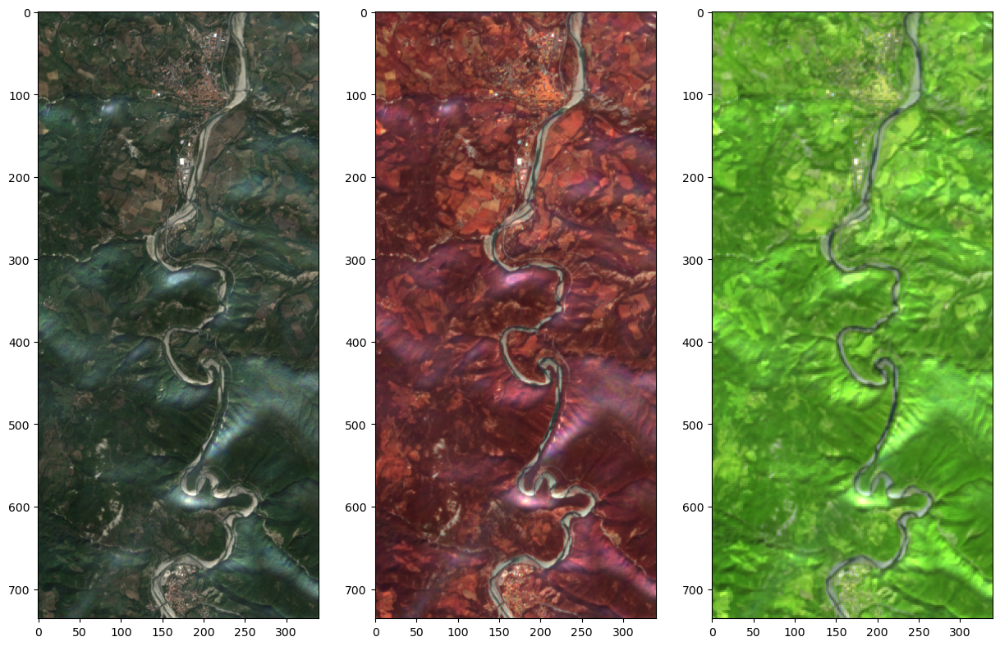

In [8]:
fig, ax = plt.subplots(1, 3)
fig.set_figwidth(15)
fig.set_figheight(10)
display_s2_image(eopatches[0], bands=(2,1,0), axes=ax[0])
display_s2_image(eopatches[0], bands=(7,2,0), axes=ax[1])
display_s2_image(eopatches[0], bands=(7,6,2), axes=ax[2], exp=3)
#plt.savefig("bands.png")

The first combination is called natural color because we are mapping bands B04, B03, B02 to their respectively Red, Green and Blue channels (as you can see from the spectrum diagram above)

Now let's display the entire timeseries (natural color band combination)

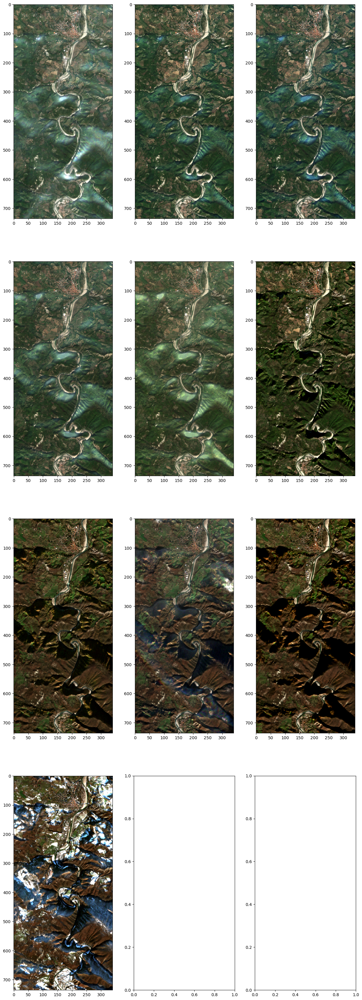

In [9]:
t,h,w,b = eopatches[0]['data']['BANDS'].shape

num_cols = 3
num_rows = math.ceil(t / num_cols)

fig, ax = plt.subplots(num_rows, num_cols)
fig.set_figwidth(5 * num_cols)
fig.set_figheight(num_rows * 5 * h / w )

for time_idx in range(0, t):
    row = math.floor(time_idx / num_cols)
    col = time_idx % num_cols
    display_s2_image(eopatches[0], time_idx=time_idx, axes=ax[row, col], exp=5)

Together with the bands in the "data" object you will find also some other arrays mainly derived from the bands array:
* NDVI: Normalized difference vegetation index. Is obtained through the following formula: (B08 - B04)/(B08 + B04). Useful to monitor vegetation health
* NDWI: Normalized difference water index. Is obtained through the following formula:(B03 - B08)/(B03 + B08). Useful to monitor vegetation health
* NORM: Euclidean norm of all bands
* FEATURES: It is just the union of the BANDS array with the index arrays described above (NDVI, NDWI and NORM). This is the final array that should be used for the required ML task 

In [10]:
eopatches[0]['data']['NDVI'].shape

(10, 736, 340, 1)

The "mask" object contains useful information about the validity of the data. In particular:
* CLM: Cloud mask. A boolean mask to distinguish between pixel with and without clouds
* IS_DATA: A boolean mask to filter out areas of the image that don't contain satellite data
* IS_VALID: A combination of the above mask. This is the mask that should be used to distinguish between valid and non valid image pixels

The image at time index 6 shown above contained some clouds. Let's check the corresponding mask array

In [11]:
cl_pix = dict(zip(np.unique(eopatches[3]['mask']['IS_VALID'][6], return_counts = True)[0],np.unique(eopatches[3]['mask']['IS_VALID'][6], return_counts = True)[1]))

In [12]:
cl_pix[True]/(cl_pix[True]+cl_pix[False])

0.8652813299232737

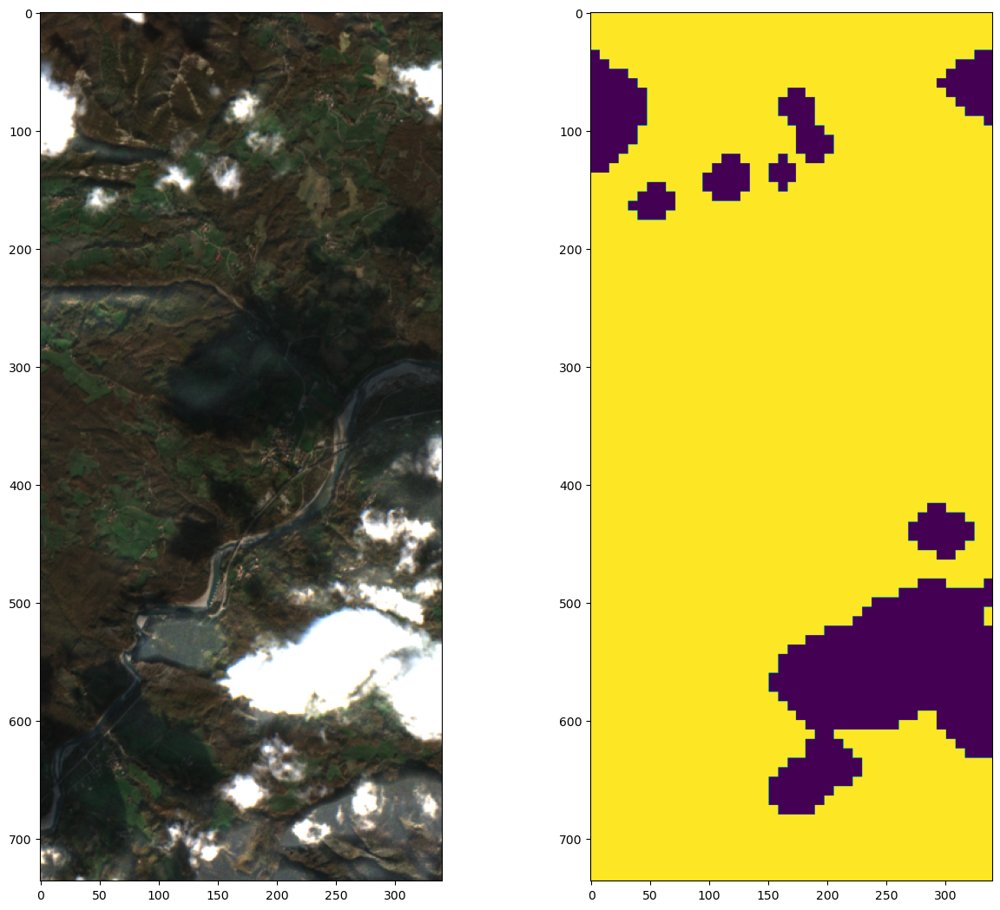

In [13]:
time_idx = 6
validity_mask = eopatches[3]['mask']['IS_VALID'][time_idx]
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(15)
fig.set_figheight(13)
display_s2_image(eopatches[3], time_idx=time_idx, axes=ax[0])
ax[1].imshow(validity_mask[:, :, 0]);
plt.savefig("clouds.png")

Lastly the "mask_timeless" object contains pixel information that are only related to the geographic location, not to the time of acquisition of the data. For our task to only relevant array here is "LULC", containing the data classification for each pixel location of the image. Here is the class number/label list:
* 0: 'No data'
* 1: 'Other'
* 2: 'Artificial Surface'
* 3: 'Broad-leaved forest'
* 4: 'Coniferous forest'
* 5: 'Water'
* 6: 'Grassland'


In [19]:
def get_lulc_classes():
    class_labels = ['No data', 'Other', 'Artificial Surface', 'Broad-leaved forest', 'Coniferous forest',  'Water', 'Grassland']
    class_colors = [
        (1, 1, 1, 0),
        (0.9, 0.5, 0.05, 1),
        (246 / 255, 0, 0, 1 ),
        (70 / 255, 158 / 255, 74 / 255, 1),
        (28 / 255, 92 / 255, 36 / 255, 1),
        (0, 0, 1, 1),
        (163 / 255, 199 / 255, 56 / 255, 1)
    ]
        
    return class_labels, class_colors

def display_labels(patch, colors, axes=None):
    colormap = mpl.colors.ListedColormap(colors)
    colornorm = mpl.colors.BoundaryNorm(np.arange(-0.5, len(colors), 1), colormap.N)
    
    labels_data = patch['mask_timeless']['LULC']
    if (axes):
        return axes.imshow(labels_data[:,:, 0], cmap=colormap, norm=colornorm)
    else:
        plt.figure(figsize = (15,15))
        return plt.imshow(labels_data[:,:, 0], cmap=colormap, norm=colornorm)

In [20]:
lulc_labels, lulc_colors = get_lulc_classes()

In [21]:
colormap = mpl.colors.ListedColormap(lulc_colors)
colornorm = mpl.colors.BoundaryNorm(np.arange(-0.5, len(lulc_colors), 1), colormap.N)

In [22]:
lulc_colors

[(1, 1, 1, 0),
 (0.9, 0.5, 0.05, 1),
 (0.9647058823529412, 0, 0, 1),
 (0.27450980392156865, 0.6196078431372549, 0.2901960784313726, 1),
 (0.10980392156862745, 0.3607843137254902, 0.1411764705882353, 1),
 (0, 0, 1, 1),
 (0.6392156862745098, 0.7803921568627451, 0.2196078431372549, 1)]

Let us plot a histogram of the distribution of labels for a given acquisition of the selected eopatch 

In [23]:
label_dict = dict(zip(range(7),lulc_labels))

bin_names = []
for i in np.unique(eopatches[0]['mask_timeless']['LULC'],return_counts=True)[0]:
    bin_names.append(label_dict[i])

<AxesSubplot:>

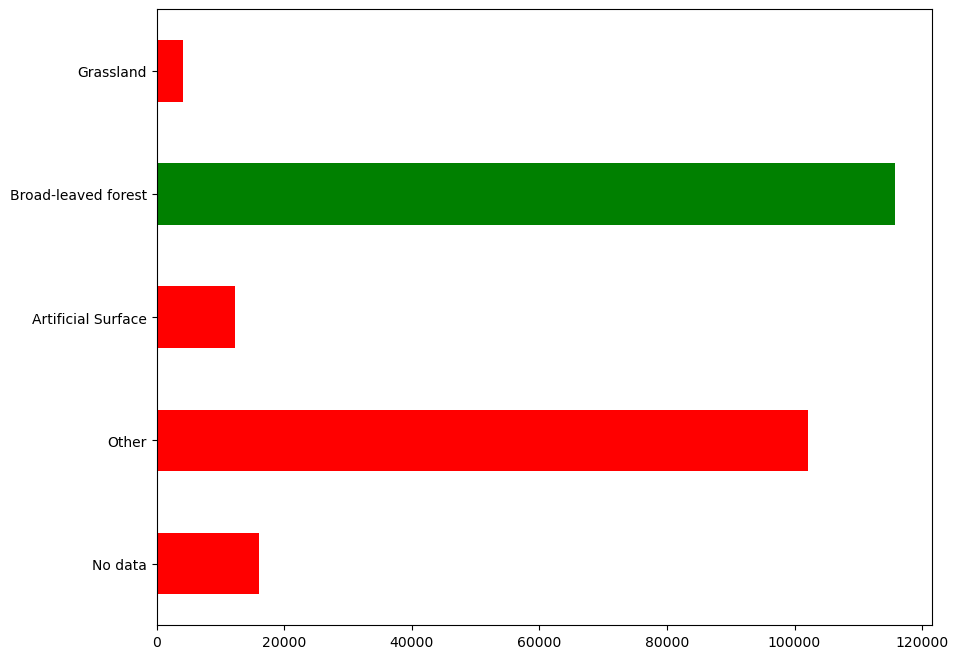

In [24]:
fig = plt.figure(figsize=(10, 8))

hist1 = dict(zip(bin_names,np.unique(eopatches[0]['mask_timeless']['LULC'],return_counts=True)[1]))
s = pd.Series(dict(zip(hist1.keys(), hist1.values())))
s.plot(kind='barh', color = ['r','r','r','g','r'])
#plt.savefig("label_distr.png")

Let's display the classification given by the labels for the first acquisition of the selected eopatch 

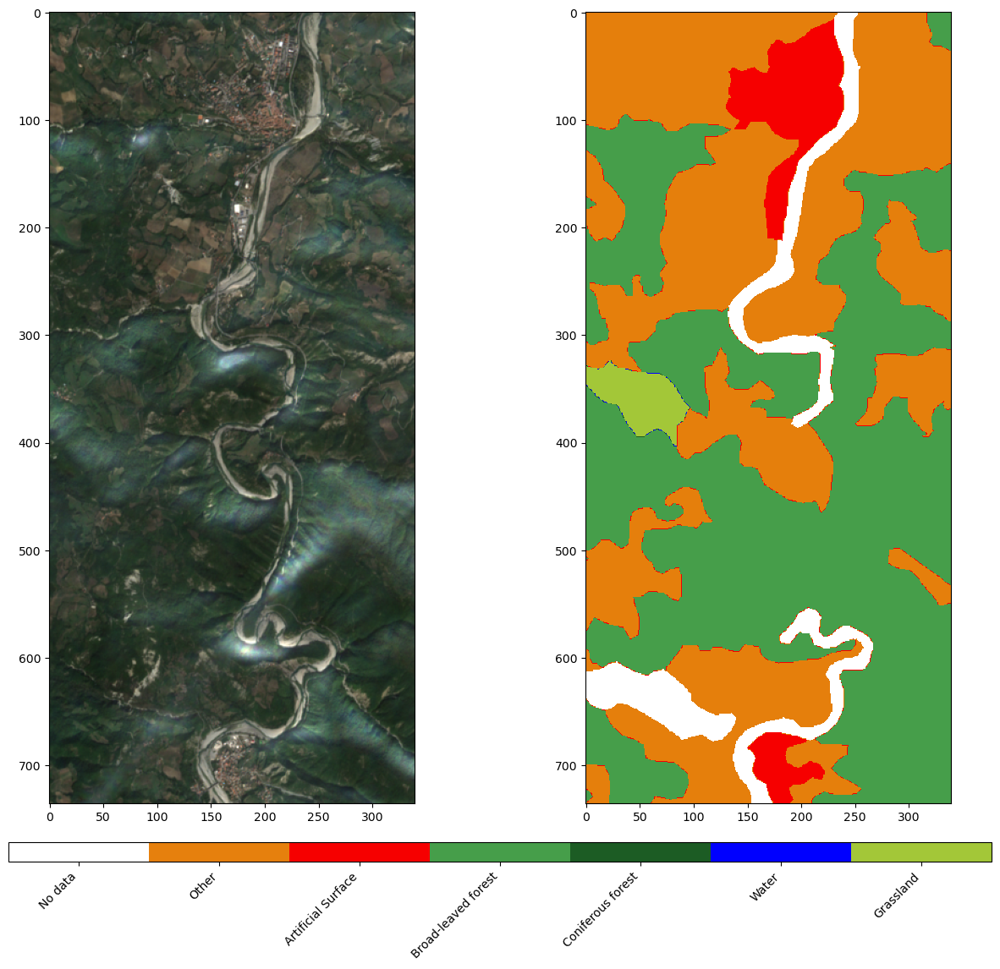

In [25]:
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(15)
fig.set_figheight(15)
display_s2_image(eopatches[0], time_idx=0, axes=ax[0])
labels_img = display_labels(eopatches[0], lulc_colors, axes=ax[1])
cb = fig.colorbar(labels_img, ax=ax.ravel().tolist(), orientation='horizontal', pad=0.04, aspect=50)
cb.set_ticks(ticks=np.linspace(0,len(lulc_colors) - 1, len(lulc_colors)))
cb.ax.set_xticklabels(lulc_labels, rotation=45, fontsize=10,  ha="right");
#plt.savefig("pixel_classif.png")

We want to distinguish forests from the other classes. So we define a binary classification. In the positive class we have: broad-leaved forest, coniferous forest, and water; in the negative class (non-forest) we have the remaining categories. 

In [26]:
def binary_lbl(eo_patch):
    
   binary_label = np.zeros(eo_patch['mask_timeless']['LULC'].shape)
   for i in range(len(eo_patch['mask_timeless']['LULC'])):
               for j in range(len(eo_patch['mask_timeless']['LULC'][0])):
                     if eo_patch['mask_timeless']['LULC'][i][j] in (3,4,5):
                         binary_label[i][j] = 1
                     else:  
                         binary_label[i][j] = 0
   return binary_label                         

In [27]:
def binary_classes():
    class_labels = ['No forest', 'Forest']
    class_colors = [
        (1, 1, 1, 0),
        (70 / 255, 158 / 255, 74 / 255, 1)
    ]
        
    return class_labels, class_colors

def display_binary_labels(labels_data, colors, axes=None):
    colormap = mpl.colors.ListedColormap(colors)
    colornorm = mpl.colors.BoundaryNorm(np.arange(-0.5, len(colors), 1), colormap.N)
    
    if (axes):
        return axes.imshow(labels_data[:,:, 0], cmap=colormap, norm=colornorm)
    else:
        plt.figure(figsize = (15,15))
        return plt.imshow(labels_data[:,:, 0], cmap=colormap, norm=colornorm)

In [28]:
lulc_labels, lulc_colors = binary_classes()

colormap = mpl.colors.ListedColormap(lulc_colors)
colornorm = mpl.colors.BoundaryNorm(np.arange(-0.5, len(lulc_colors), 1), colormap.N)

Let us display the same acquisition shown above but now with the binary forest/non-forest classification.  

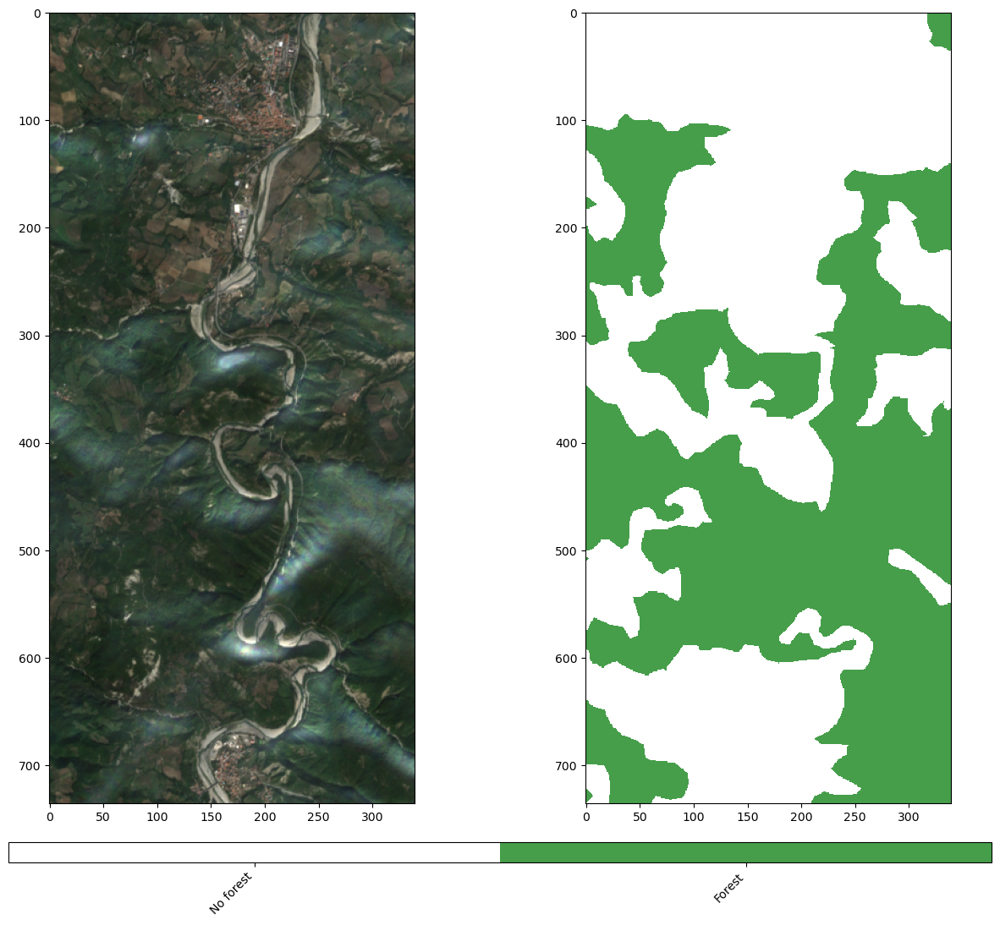

In [29]:
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(15)
fig.set_figheight(15)
display_s2_image(eopatches[0], time_idx=0, axes=ax[0])
labels_img = display_binary_labels(binary_lbl(eopatches[0]), lulc_colors, axes=ax[1])
cb = fig.colorbar(labels_img, ax=ax.ravel().tolist(), orientation='horizontal', pad=0.04, aspect=50)
cb.set_ticks(ticks=np.linspace(0,len(lulc_colors) - 1, len(lulc_colors)))
cb.ax.set_xticklabels(lulc_labels, rotation=45, fontsize=10,  ha="right");
#plt.savefig("binary_class.png")

As explained above, one of the key indicators of vegetation health is the NDVI index. Let us visualize whether it is actually capable of distinguishing between the two classes defined (forest/non-forest). 

In [30]:
ndvi = eopatches[0]['data']['NDVI'][0].reshape(736*340)

In [31]:
forest = binary_lbl(eopatches[0]).reshape(736*340)

In [32]:
fr = []
nof = []
for i in list(zip(ndvi,forest)):
    if i[1] == 1:
        fr.append(i[0])
    else:
        nof.append(i[0])

From the boxplot below we can see that the average NDVI is slightly different for the two classes. It is lower for the non-forest (negative) class. However, the distributions largely overlap as you can see from the histogram below. 

([<matplotlib.axis.XTick at 0x17bac5bd0>,
 [Text(1, 0, 'Forest'), Text(2, 0, 'Non-forest')])

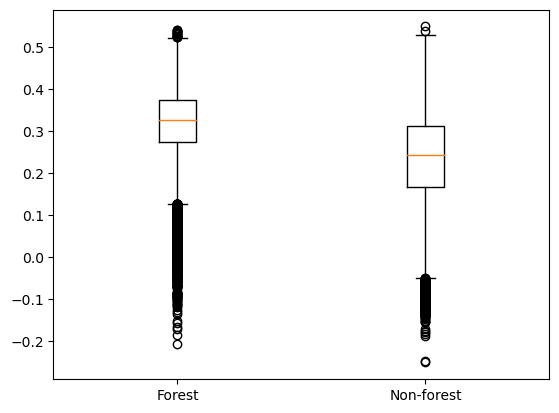

In [33]:
data = [fr,nof]
plt.boxplot(data)
plt.xticks([1, 2], ['Forest', 'Non-forest'])
#plt.savefig("ndvi1.png")

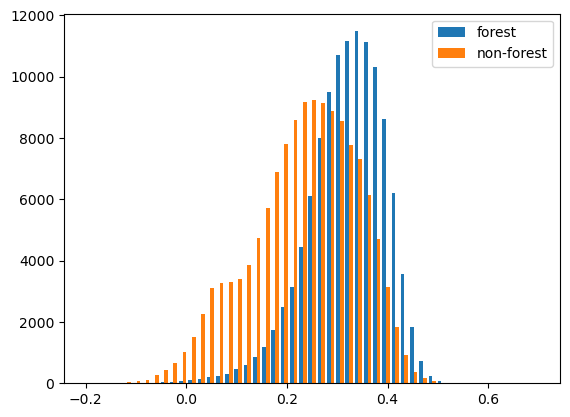

In [34]:
plt.hist([fr, nof], bins= np.linspace(-0.2, 0.7, 50), label=['forest', 'non-forest'])
plt.legend(loc='upper right')
#plt.savefig("ndvi2.png")
plt.show()

# ML approach for forest monitoring

Our goal is to build a model to monitor the presence and evolution of forests over a given area covered by Sentinel-2. Thus, given a certain image acquisition from the satellite at a given time we would like to automatically spot the area covered by forests. Then, the automated labelling (forest/non-forest parts of the area) should be repeated for diferent images in time taken from the same area to see whether there is a reduction of forests (sign of deforestation).  

Thus, our problem can be divided in two parts: 
* Forest detection algorithm: classify the different parts of an image into forest and non-forest
* Deforestation algorithm: identify whether there is a reduction of the forest coverage of a given area over time

We mainly address the first task here. There are two possible approaches to address this computer vision problem: 
* Full-image-based classification or semantic segmentation (Neural networks) 
* Pixel-based classification (ML algorithms)

We will follow this second (even if less powerful) approach. 

Let us first visualize the full area of interest:

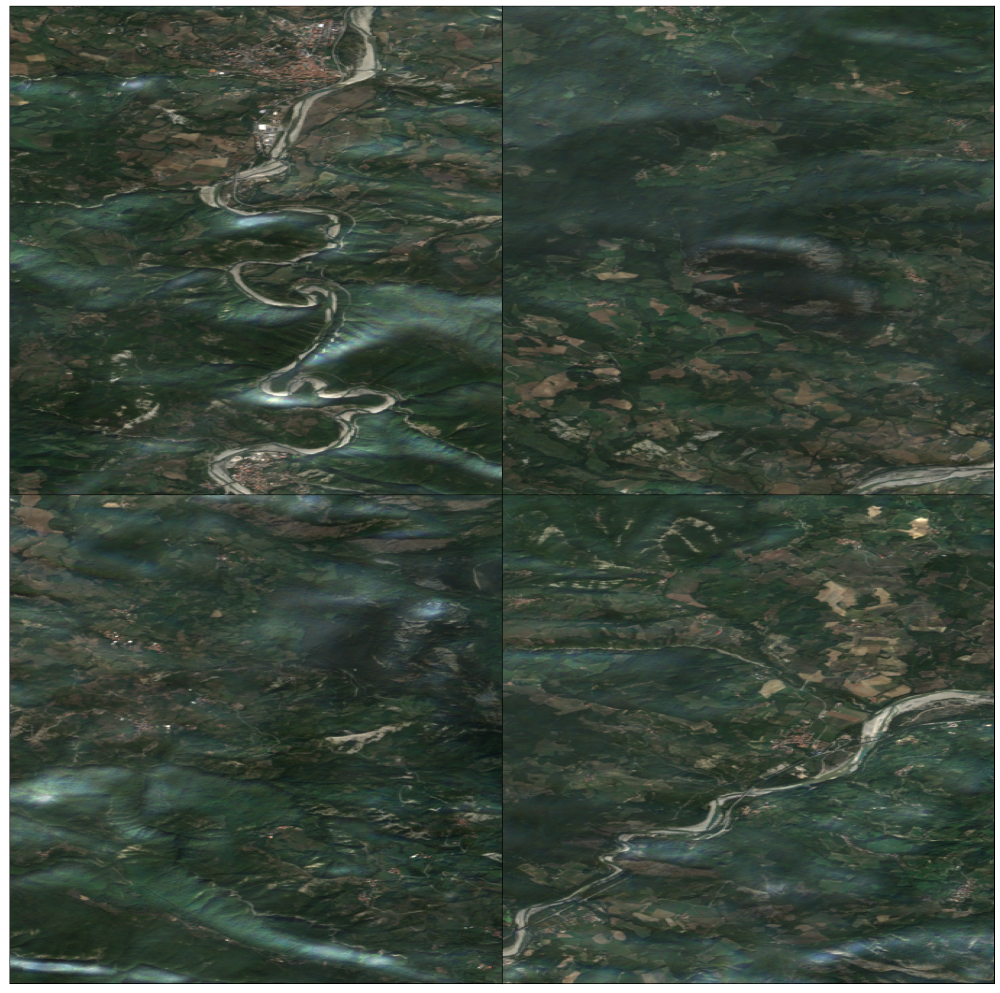

In [35]:
fig = plt.figure(figsize=(20, 20))


for i in range(4):
    eopatch = eopatches[i]
    ax = plt.subplot(2, 2, i + 1)
    plt.imshow(np.clip(eopatch['data']['BANDS'][0][..., [2, 1, 0]] * 3.5, 0, 1))
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)
#plt.savefig("fullarea.png")

And the corresponding binary masking/labelling:

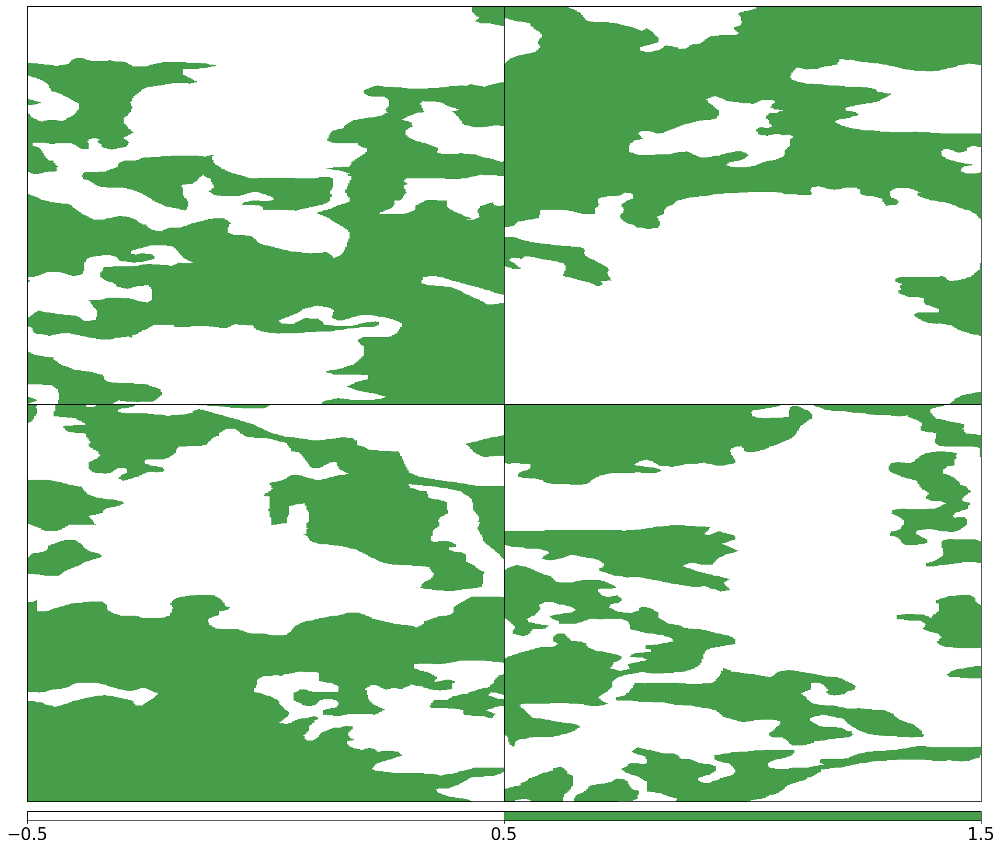

In [36]:
fig, axes = plt.subplots(figsize=(20, 20), nrows=2, ncols=2)


for i, ax in enumerate(axes.flat):
    eopatch = eopatches[i]
    im = ax.imshow(binary_lbl(eopatch)[:,:,0], cmap=colormap, norm=colornorm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20) 
plt.show()
#plt.savefig("fullareamask.png")

## Data preparation

We will use a binary classifier to predict whether a given pixel is more likely to be "forest" or "non-forest". Being pixel based, the model will not have any indication on the overall picture. Our attempt to partially correct this and, thus, providing the algorithm with some indication on the fact that the pixels are part of a full image, we will include as features of our data also the pixel position. 

In [37]:
pixels_pos = list(np.ndindex(736,340))
p1, p2 = list(zip(*pixels_pos)) 
p1 = np.array(p1)
p2 = np.array(p2)
p1p2 = np.append(p1[:,None], p2[:,None], axis = 1)

We have 4 eopatches and thus 4 labeled images (the masking is timeless, so it is unique for all the acuisitions at different times of the same area). Thus, our data for training (and validation) will be given by one acquisition for the first 3 eopatches. We will keep the last eopatch for testing our model. The number of training examples will be then given by 3*736*340 and the features will be the 8 bands + 3 indices (NDVI, NDWI, NORM) + 2 pixel axes. 

In [38]:
X = np.array([np.append(eopatch['data']['FEATURES'][0].reshape(736*340, 11), p1p2,axis = 1) for eopatch in eopatches[:3]])
X = X.reshape(3*250240,13)

In [39]:
y = np.array([binary_lbl(eopatch) for eopatch in eopatches[:3]])
y  = y.reshape(3*736*340,1)

We keep 10% of data for cross validation: 

In [40]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

Drop NaN values:

In [41]:
X_train = np.where(np.isnan(X_train), np.ma.array(X_train, mask=np.isnan(X_train)).mean(axis=0), X_train) 
X_valid = np.where(np.isnan(X_valid), np.ma.array(X_valid, mask=np.isnan(X_valid)).mean(axis=0), X_valid)

In [42]:
np.unique(np.isnan(X_train))

array([False])

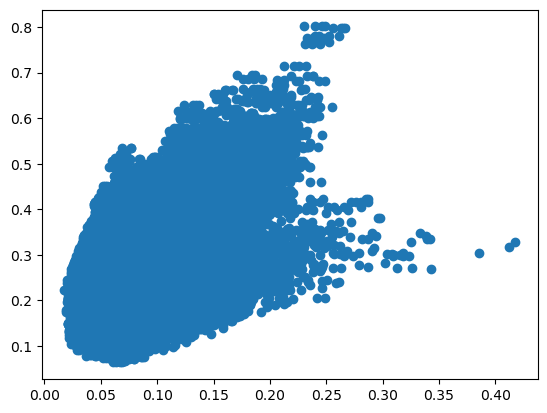

In [43]:
plt.scatter(X_train[:,0], X_train[:,5])

We rescale data (mean subtraction and division by std) and perform PCA. 

In [44]:
scaler = StandardScaler()
scaler = scaler.fit(X_train)
X_train = scaler.transform(X_train)

In [45]:
pca = decomposition.PCA()
pca.fit(X_train)
X_train = pca.transform(X_train)

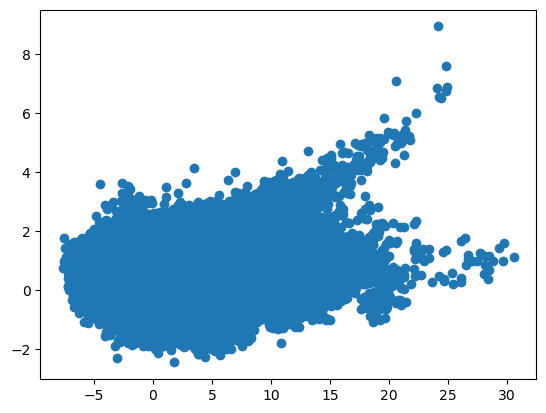

In [46]:
plt.scatter(X_train[:,0], X_train[:,5])

## Training and performance evaluation 

It is a supervised ML task, where the training examples are pixels and the labels are given by the binary masking (0 = non-forest, 1= forest). 
We will train a gradient boosting algorith for binary classification with:

* Log-loss cost function
* learning rate = 0.01
* max depth of the trees = 5

Other parameters specified below. 

In [47]:
grd = GradientBoostingClassifier(n_estimators=80, max_features = 3, max_depth = 5, learning_rate = 0.01, min_samples_split= 50, min_samples_leaf= 20)

In [ ]:
grd.fit(X_train, y_train[:,0])

Validation data is given by a random 10% selection of pixels from the first 3 eopatches. 

In [ ]:
X_valid = scaler.transform(X_valid)
X_valid = pca.transform(X_valid)

As test data to evaluate the performance of our model we use the first acquisition of the last eopatch, which was not among the eopatches used to train the GBM model. 

In [ ]:
X_test1 = np.array(np.append(eopatches[3]['data']['FEATURES'][1].reshape(736*340, 11), p1p2,axis = 1))
X_test1 = np.where(np.isnan(X_test1), np.ma.array(X_test1, mask=np.isnan(X_test1)).mean(axis=0), X_test1) 
X_test1 = scaler.transform(X_test1)
X_test1 = pca.transform(X_test1)

In [ ]:
y_test = np.array(binary_lbl(eopatches[3]))
y_test = y_test.reshape(736*340,1)

In [ ]:
y_pred_grd_val = grd.predict_proba(X_valid)
y_pred_grd_train = grd.predict_proba(X_train)
y_pred_grd_test = grd.predict_proba(X_test1)
fpr_grd_train, tpr_grd_train, _ = roc_curve(y_train[:,0], y_pred_grd_train[:, 1])
fpr_grd_val, tpr_grd_val, thr_grd_val = roc_curve(y_valid[:,0], y_pred_grd_val[:, 1])
fpr_grd_test, tpr_grd_test, thr_grd_test = roc_curve(y_test[:,0], y_pred_grd_test[:, 1])

In [ ]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_grd_train, tpr_grd_train, label='GRD Train')
plt.plot(fpr_grd_val, tpr_grd_val, label='GRD Val')
plt.plot(fpr_grd_test, tpr_grd_test, label='GRD Test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.savefig("ROC.png")
plt.show()
#plt.savefig("ROC.png")

In [ ]:
print("AUC training = ", auc(fpr_grd_train, tpr_grd_train))

In [ ]:
print("AUC validation = ", auc(fpr_grd_val, tpr_grd_val))

In [ ]:
print("AUC testing = ",auc(fpr_grd_test, tpr_grd_test))

We plot the confusion matrix on training set:

In [ ]:
fig = plt.figure(figsize=(8, 8))

conf_matrix_gbm = confusion_matrix(y_train[:,0], grd.predict(X_train))
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(['Forest','Non-forest']) if idx in [1,0]], 
                      normalize=True, 
                      ylabel='Truth (LAND COVER)', 
                      xlabel='Predicted (GBM)',
                      title='Confusion matrix');
plt.tight_layout()
#plt.savefig("cftr.png")

We plot the confusion matrix on test set:

In [ ]:
fig = plt.figure(figsize=(8, 8))

conf_matrix_gbm = confusion_matrix(y_test[:,0], grd.predict(X_test1))
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(['Forest','Non-forest']) if idx in [1,0]], 
                      normalize=True, 
                      ylabel='Truth (LAND COVER)', 
                      xlabel='Predicted (GBM)',
                      title='Confusion matrix');
plt.tight_layout()
#plt.savefig("cfte.png")

In [ ]:
print("Average precision-recall on training: ", average_precision_score(y_train[:,0], y_pred_grd_train[:, 1]))

In [ ]:
print("Average precision-recall on testing: ", average_precision_score(y_test[:,0], y_pred_grd_test[:, 1]))

# Automated forest monitoring 

We have built our model to classify pixels into forest/non-forest. Now we will use it to compare the predicted binary masking of images of the same area (last eopatch) acquired at different times. By comparing the prediction for forest coverage we will be able to see if there is a change over time or not. 
There can be several factors producing a change in forest composition which do not necessarily signal deforestation. The most immediate one is the natural seasonal change of an area forestation. Thus, we will base our criterion for deforestation on the combined comparision of the NDVI and the predicted classification given by the model. The anomaly (change in forest composition) must be also persistent in time so we will claim a potential deforestation if the change is confirmed in three images. Much more refined methods and criteria should be investigated. 

In [126]:
X_test2 = np.array(np.append(eopatches[3]['data']['FEATURES'][5].reshape(736*340, 11), p1p2,axis = 1))
X_test3 = np.array(np.append(eopatches[3]['data']['FEATURES'][9].reshape(736*340, 11), p1p2,axis = 1))

In [127]:
X_test2 = np.where(np.isnan(X_test2), np.ma.array(X_test2, mask=np.isnan(X_test2)).mean(axis=0), X_test2) 
X_test2 = scaler.transform(X_test2)
X_test2 = pca.transform(X_test2)
X_test3 = np.where(np.isnan(X_test3), np.ma.array(X_test3, mask=np.isnan(X_test3)).mean(axis=0), X_test3) 
X_test3 = scaler.transform(X_test3)
X_test3 = pca.transform(X_test3)

In [128]:
y_pred1 = grd.predict(X_test1)
y_pred2 = grd.predict(X_test2)
y_pred3 = grd.predict(X_test3)

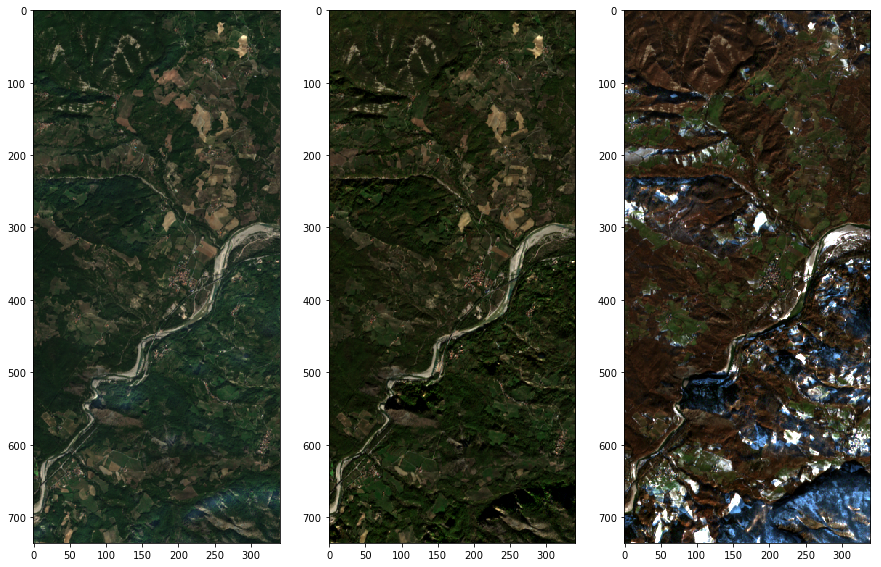

In [129]:
fig, ax = plt.subplots(1, 3)
fig.set_figwidth(15)
fig.set_figheight(10)
display_s2_image(eopatches[3], time_idx=1, axes=ax[0])
display_s2_image(eopatches[3], time_idx=5, axes=ax[1])
display_s2_image(eopatches[3], time_idx=9, axes=ax[2])
plt.savefig("eo3.png")

In [130]:
y1_labels = y_pred1.reshape(736,340,1)
y2_labels = y_pred2.reshape(736,340,1)
y3_labels = y_pred3.reshape(736,340,1)

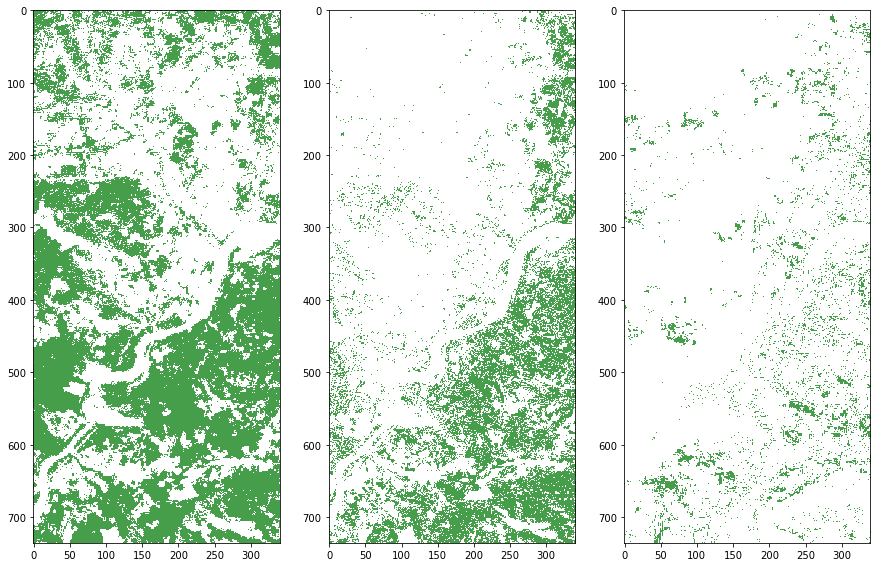

In [131]:
lulc_labels, lulc_colors = binary_classes()

fig, ax = plt.subplots(1, 3)
fig.set_figwidth(15)
fig.set_figheight(15)
display_binary_labels(y1_labels, lulc_colors, axes=ax[0])
display_binary_labels(y2_labels, lulc_colors, axes=ax[1])
display_binary_labels(y3_labels, lulc_colors, axes=ax[2]);
plt.savefig("eo3_pred.png")

In [70]:
diff_img12 = y2_labels - y1_labels
diff_img13 = y3_labels - y1_labels

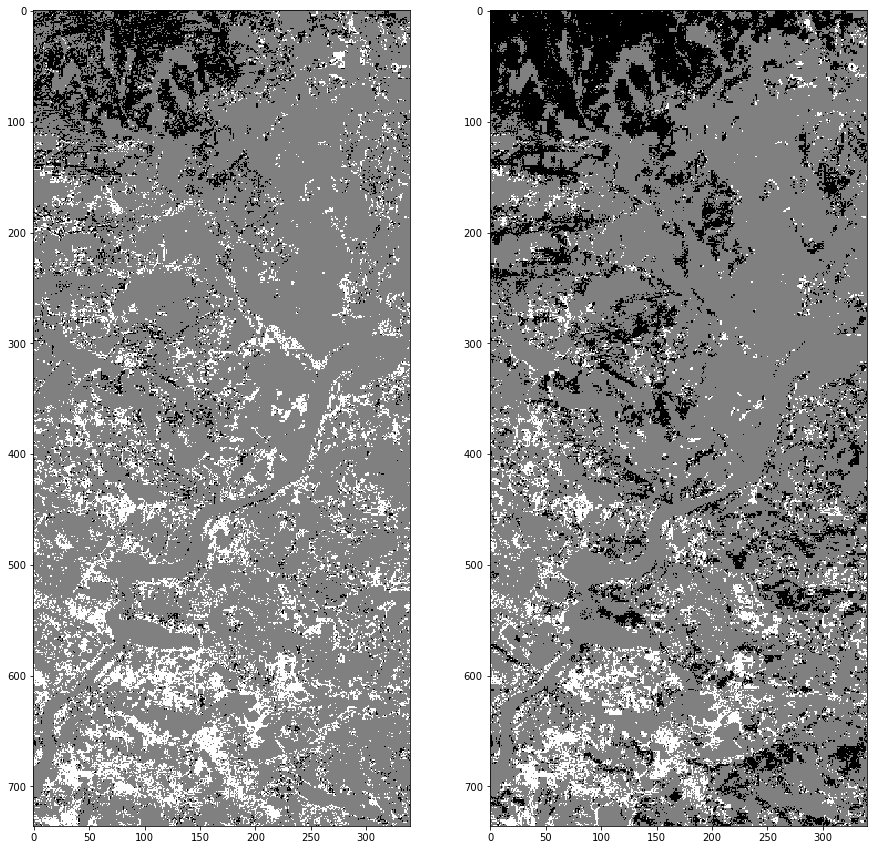

In [71]:
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(15)
fig.set_figheight(15)
ax[0].imshow(diff_img12[:,:,0], cmap='gray')
ax[1].imshow(diff_img13[:,:,0], cmap='gray');

In [85]:
diff12 = dict(zip(np.unique(y2_labels == y1_labels, return_counts = True)[0],np.unique(y2_labels == y1_labels, return_counts = True)[1]))
diff_perc12 = diff12[True]/(diff12[True]+diff12[False])

In [84]:
diff13 = dict(zip(np.unique(y3_labels == y1_labels, return_counts = True)[0],np.unique(y3_labels == y1_labels, return_counts = True)[1]))
diff_perc13 = diff13[True]/(diff13[True]+diff13[False])

In [89]:
fcover1 = len(y1_labels[y1_labels==1])
fcover2 = len(y2_labels[y2_labels==1])
fcover3 = len(y3_labels[y3_labels==1])

In [112]:
m_ndvi = []
s_ndvi = []
ndvi = []
for i in [0,2,4]:
    m_ndvi.append(norm.fit((np.where(np.isnan(eopatches[3]['data']['NDVI'][i]), np.ma.array(eopatches[3]['data']['NDVI'][i], mask=np.isnan(eopatches[3]['data']['NDVI'][i])).mean(axis=0), eopatches[3]['data']['NDVI'][i])))[0])
    ndvi.append(np.where(np.isnan(eopatches[3]['data']['NDVI'][i]), np.ma.array(eopatches[3]['data']['NDVI'][i], mask=np.isnan(eopatches[3]['data']['NDVI'][i])).mean(axis=0), eopatches[3]['data']['NDVI'][i]))
    s_ndvi.append(norm.fit((np.where(np.isnan(eopatches[3]['data']['NDVI'][i]), np.ma.array(eopatches[3]['data']['NDVI'][i], mask=np.isnan(eopatches[3]['data']['NDVI'][i])).mean(axis=0), eopatches[3]['data']['NDVI'][i])))[1])

In [137]:
def forest_monitoring(eopatch, t_idx, model, scaler, pca, pixels_pos):
    
  p1p2 = pixels_pos
  X_test1 = np.array(np.append(eopatch['data']['FEATURES'][t_idx[0]].reshape(736*340, 11), p1p2,axis = 1))
  X_test2 = np.array(np.append(eopatch['data']['FEATURES'][t_idx[1]].reshape(736*340, 11), p1p2,axis = 1))
  X_test3 = np.array(np.append(eopatch['data']['FEATURES'][t_idx[2]].reshape(736*340, 11), p1p2,axis = 1))
  X_test1 = np.where(np.isnan(X_test1), np.ma.array(X_test1, mask=np.isnan(X_test1)).mean(axis=0), X_test1) 
  X_test1 = scaler.transform(X_test1)
  X_test1 = pca.transform(X_test1)
  X_test2 = np.where(np.isnan(X_test2), np.ma.array(X_test2, mask=np.isnan(X_test2)).mean(axis=0), X_test2) 
  X_test2 = scaler.transform(X_test2)
  X_test2 = pca.transform(X_test2)
  X_test3 = np.where(np.isnan(X_test3), np.ma.array(X_test3, mask=np.isnan(X_test3)).mean(axis=0), X_test3) 
  X_test3 = scaler.transform(X_test3)
  X_test3 = pca.transform(X_test3) 
    
  y_pred1 = model.predict(X_test1)
  y_pred2 = model.predict(X_test2)
  y_pred3 = model.predict(X_test3)
  y1_labels = y_pred1.reshape(736,340,1)
  y2_labels = y_pred2.reshape(736,340,1)
  y3_labels = y_pred3.reshape(736,340,1)

  diff12 = dict(zip(np.unique(y2_labels == y1_labels, return_counts = True)[0],np.unique(y2_labels == y1_labels, return_counts = True)[1]))
  diff_perc12 = diff12[True]/(diff12[True]+diff12[False])
  diff13 = dict(zip(np.unique(y3_labels == y1_labels, return_counts = True)[0],np.unique(y3_labels == y1_labels, return_counts = True)[1]))
  diff_perc13 = diff13[True]/(diff13[True]+diff13[False])
   
  fcover1 = len(y1_labels[y1_labels==1])
  fcover2 = len(y2_labels[y2_labels==1])
  fcover3 = len(y3_labels[y3_labels==1])

  m_ndvi = []
  s_ndvi = []
  ndvi = []
  for i in t_idx:
    m_ndvi.append(norm.fit((np.where(np.isnan(eopatch['data']['NDVI'][i]), np.ma.array(eopatch['data']['NDVI'][i], mask=np.isnan(eopatch['data']['NDVI'][i])).mean(axis=0), eopatch['data']['NDVI'][i])))[0])
    s_ndvi.append(norm.fit((np.where(np.isnan(eopatch['data']['NDVI'][i]), np.ma.array(eopatch['data']['NDVI'][i], mask=np.isnan(eopatch['data']['NDVI'][i])).mean(axis=0), eopatch['data']['NDVI'][i])))[1])
    ndvi.append(np.where(np.isnan(eopatch['data']['NDVI'][i]), np.ma.array(eopatch['data']['NDVI'][i], mask=np.isnan(eopatch['data']['NDVI'][i])).mean(axis=0), eopatch['data']['NDVI'][i]).reshape(736*340))
    print("Diff 12: ", diff_perc12 )
    print("Diff 13: ", diff_perc13 )
  if diff_perc12 < 0.7 and diff_perc13 <0.7:
    print("Change in forest cover over time!")
    print("Percentage difference between acquisition 1 and 2: ", diff_perc12)
    print("Percentage difference between acquisition 1 and 3: ", diff_perc13)
    if (fcover1-fcover2)/fcover1 > 0.3 and (fcover1-fcover3)/fcover1 > 0.3:
        print("Forest coverage reduction over time!")
        print("Reduction from acquisition 1 and 2 :", (fcover1-fcover2)/fcover1)
        print("Reduction from acquisition 1 and 3 :", (fcover1-fcover3)/fcover1)
        print("Change NDVI 1 2: ", m_ndvi[1]-m_ndvi[0])
        print("Change NDVI 1 3: ", m_ndvi[2]-m_ndvi[0])
        print("m1", m_ndvi[0])
        print("s1", s_ndvi[0])
        print("m2", m_ndvi[1])
        print("s2", s_ndvi[1])
        print("m3", m_ndvi[2])
        print("s3", s_ndvi[2])
        if (m_ndvi[1]+s_ndvi[1]-m_ndvi[0]+s_ndvi[0])<0 and (m_ndvi[2]+s_ndvi[2]-m_ndvi[0]+s_ndvi[0])<0:
            print("Repeated anomaly! Significant forest reduction over time!")
        else:
            plt.hist([ndvi[0], ndvi[1], ndvi[2]], bins= np.linspace(-0.2, 0.7, 50), label=['acq 1', 'acq 2', 'acq 3'])
            plt.legend(loc='upper right')
            plt.savefig("ndvi_ch.png")
            plt.show()
            print("NDVI remains consistent over time! Non-significant anomaly!")
  else:
    print("Non-significant anomaly! Keep monitoring the area!")

In [133]:
forest_monitoring(eopatches[3], [0,2,4], grd, scaler, pca, p1p2)

Diff 12:  0.7879515664961637
Diff 13:  0.7465433184143222
Diff 12:  0.7879515664961637
Diff 13:  0.7465433184143222
Diff 12:  0.7879515664961637
Diff 13:  0.7465433184143222
Non-significant anomaly! Keep monitoring the area!


Diff 12:  0.6838235294117647
Diff 13:  0.5202565537084399
Diff 12:  0.6838235294117647
Diff 13:  0.5202565537084399
Diff 12:  0.6838235294117647
Diff 13:  0.5202565537084399
Change in forest cover over time!
Percentage difference between acquisition 1 and 2:  0.6838235294117647
Percentage difference between acquisition 1 and 3:  0.5202565537084399
Forest coverage reduction over time!
Reduction from acquisition 1 and 2 : 0.5097600737446761
Reduction from acquisition 1 and 3 : 0.8809501455262416
Change NDVI 1 2:  0.04811341814121023
Change NDVI 1 3:  -0.16911364936403603
m1 0.3801428629461422
s1 0.1501996651388236
m2 0.4282562810873524
s2 0.1960373509383063
m3 0.21102921358210616
s3 0.15496094692350756


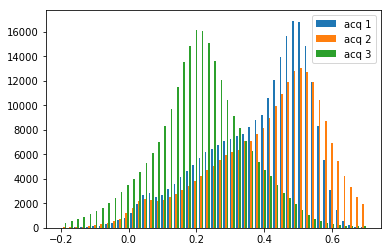

NDVI remains consistent over time! Non-significant anomaly!


In [138]:
forest_monitoring(eopatches[3], [1,5,9], grd, scaler, pca, p1p2)

Change in forest cover over time!
Percentage difference between acquisition 1 and 2:  0.5699648337595908
Percentage difference between acquisition 1 and 3:  0.562823689258312
Forest coverage reduction over time!
Reduction from acquisition 1 and 2 : 0.8951936730644449
Reduction from acquisition 1 and 3 : 0.9086130206227254
Change NDVI 1 2:  0.01931017921986572
Change NDVI 1 3:  -0.059485162826077714


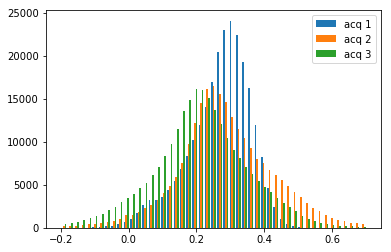

NDVI remains consistent over time! Non-significant anomaly!


In [127]:
forest_monitoring(eopatches[3], [0,7,9], grd, scaler, pca, p1p2)